In [1]:
# download data from your google drive
#from google.colab import drive
#drive.mount('/gdrive')
#%cd /gdrive
#%cp "/gdrive/MyDrive/Fibermagic Tutorial" "." -r

In [1]:
#pip install git+https://github.com/faustrp/fibermagic.git

  Cloning https://github.com/faustrp/fibermagic.git to /private/var/folders/83/xf7nln4j3cgb517dgnqbv34w0000gn/T/pip-req-build-6o2ndap3
  Running command git clone --filter=blob:none --quiet https://github.com/faustrp/fibermagic.git /private/var/folders/83/xf7nln4j3cgb517dgnqbv34w0000gn/T/pip-req-build-6o2ndap3
  Resolved https://github.com/faustrp/fibermagic.git to commit 28dc2e3032c1e4d822e021eabe39c4bf5443edc6
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached dash-2.18.1-py3-none-any.whl.metadata (10 kB)
  Using cached dash_html_components-2.0.0-py3-none-any.whl.metadata (3.8 kB)
  Using cached dash_core_components-2.0.0-py3-none-any.whl.metadata (2.9 kB)
  Using cached dash_table-5.0.0-py3-none-any.whl.metadata (2.4 kB)
  Using cached retrying-1.3.4-py3-none-any.whl.metadata (6.9 kB)
Using cached dash-2.18.1-py3-none-any.whl (7.5 MB)
Using cached dash_core_components-2.0.0-py3-none-an

## Fiber Photometry using Neurophotometrics devices

There are a bunch of different photometry systems out there like TDT systems, Neurophotometrics or open-hardware approaches. In this tutorial, we will use data from Neurophotometrics as an example.

![grafik.png](attachment:grafik.png)

## Multiple Colors

With Neurophotometrics (NPM), it is possible to capture data from two fluorescent sensors simultaneously - if they emit light in different wave lengths. NPM can measure light of two different color spectra: Red and Green. Using this technology, it is possible, to e.g. express a green calcium sensor (e.g. GCaMP6f) and a red dopamine sensor (e.g. Rdlight1).

![grafik.png](attachment:grafik.png)
grafik source: https://www.researchgate.net/publication/264796291_Bright_and_fast_multi-colored_voltage_reporters_via_electrochromic_FRET/figures?lo=1

## Multiple Mice

NPM can record data from multiple mice at once - delivered through a bundle of patch cables that splits into several small branches that can be attached to individual mice.

The end of the patch chord connects to an implant (usually a fiber optic cannula) which captures the light. Here's how it looks like:

![grafik.png](attachment:grafik.png)

Before starting the recording, the researcher defines a region of interest for each cable and color. Then, NPM captures the light intensity for each region of interest seperately. All data streams are written into one single csv file per recording.

# Fibermagic Tutorial

Fibermagic is an open-source software package for the analysis of photometry data. It is written in Python and operates on pandas and numpy dataframes.

Fiber Photometry is a technique to capture neural activity in-vivo with a subsecond temporal precision. Genetically encoded fluorescent sensors are expressed by either transfection with an (AAV)-virus or transgenic expression. Strength of fluorescence is dependent on the concentration of the neurotransmitter the sensor detects. Using an glass optical fiber, it is possible to image neural dynamics and transmitter release.

![grafik.png](attachment:grafik.png)
graphik source: https://en.wikipedia.org/wiki/Fiber_photometry

Investigating a single raw data file

Let's have a look into an arbitrary recording file and try to understand the data.

In [1]:
import pandas as pd
import numpy as np
from fibermagic.IO.NeurophotometricsIO import extract_leds
import os
print(os.getcwd())
import pathlib

#from rudi_demodulate import *
#from analysis_utils import 
#from analysis_utils import *
import copy
from fibermagic import demodulate #as detrend

/Users/rudolffaust/Documents/Adenosine PR Pilot


In [499]:
# logs = pd.read_csv('raw data/07-25-2024/B7177,B7178-PR11/logs.csv')
# logs.columns = ['ComputerTimestamp', 'SystemTimestamp', 'animal.ID', 'Event', 'pi.time', 'pc.time', 'datetimestamp']
# logs = logs[logs['animal.ID']=='B7178']
# #logs.Schedule='PR11'
# logs

basepath = 'raw data/02-17-2024/B4933, B0516'
# expdate = '05-29-2023'
id = 'B0516'
active_lever = 'LL'
fullpath = basepath + '/' + 'logs.csv'
print(fullpath)
logs = pd.read_csv(fullpath)#, header=None)
#logs.columns = ['ComputerTimestamp', 'SystemTimestamp', 'animal.ID', 'Event', 'pi.time', 'pc.time', 'datetimestamp']
logs = logs[logs['animal.ID']==id]
logs

raw data/02-17-2024/B4933, B0516/logs.csv


,ComputerTimestamp,SystemTimestamp,animal.ID,Event,pi.time,pc.time,datetimestamp,Schedule
27,5.315360e+06,13936.802560,B0516,video_start,-1.000000e+00,1.708238e+09,2024-02-18 06:28:34.546634+00:00,NaN
31,5.317628e+06,13939.068610,B0516,LL,1.703188e+09,1.708238e+09,2024-02-18 06:28:36.814145+00:00,NaN
40,5.333021e+06,13954.460736,B0516,RL,1.703188e+09,1.708238e+09,2024-02-18 06:28:52.206195+00:00,NaN
47,5.347564e+06,13969.002880,B0516,BM,1.703188e+09,1.708238e+09,2024-02-18 06:29:06.746748+00:00,NaN
48,5.356218e+06,13977.654940,B0516,LL,1.703188e+09,1.708238e+09,2024-02-18 06:29:15.399442+00:00,NaN
...,...,...,...,...,...,...,...,...
653,7.953818e+06,16574.969280,B0516,BM,1.703190e+09,1.708240e+09,2024-02-18 07:12:32.675704+00:00,NaN
654,7.984584e+06,16605.733570,B0516,LL,1.703190e+09,1.708240e+09,2024-02-18 07:13:03.439164+00:00,NaN
655,7.986010e+06,16607.159616,B0516,LL,1.703190e+09,1.708240e+09,2024-02-18 07:13:04.864433+00:00,NaN
656,7.990117e+06,16611.265632,B0516,LL,1.703190e+09,1.708240e+09,2024-02-18 07:13:08.970247+00:00,NaN


In [500]:
fullpath = basepath + '/' + 'photometry.csv'
df = pd.read_csv(fullpath)
df = df.rename(columns={'R2':'Region0R','G3':'Region1G'})
#df = df.rename(columns={'SystemTimestamp':'Timestamp'})
#df = df.rename(columns={'Timestamp':'SystemTimestamp'})
#logs['SystemTimestamp']=logs['SystemTimestamp'].astype(float)
df = df[df.SystemTimestamp>=logs.iloc[1]['SystemTimestamp']]
df

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,R0,R1
3019,3019,13939.080800,4,5.316875e+06,0.087940,0.120151
3020,3020,13939.130784,1,5.316925e+06,0.023014,0.025529
3021,3021,13939.180800,4,5.316975e+06,0.087815,0.120088
3022,3022,13939.230784,1,5.317025e+06,0.023024,0.025586
3023,3023,13939.280800,4,5.317074e+06,0.087494,0.120066
...,...,...,...,...,...,...
57331,57331,16654.708288,4,8.032456e+06,0.067992,0.083936
57332,57332,16654.758272,1,8.032506e+06,0.020388,0.022776
57333,57333,16654.808288,4,8.032556e+06,0.068156,0.084007
57334,57334,16654.858272,1,8.032606e+06,0.020448,0.022832


Each Region of Interest is represented as one column. 

Timestamps indicate the device clock time when a measurement happened. SystemTimestamp is the timestamp from the clock in the NPM system, which starts from zero when the system is switched on. The FrameCounter is the frame number in the recording. 

The LEDState column encodes which LED was on at the time of a given measurement.

Because the action spectra of fluorescent proteins often overlap, multicolor photometry requires a method of separating the different fluorescence signals. The NPM system uses time-division multiplexing, in which only one of the three different colored excitation LEDs is active at a time.

![grafik.png](attachment:grafik.png)

We can use fibermagic to decode which LEDs were on at what measurement from the LEDState column.

In [494]:
from fibermagic.IO.NeurophotometricsIO import extract_leds

In [495]:
if 'Flags' in df.columns:  # legacy fix: Flags were renamed to LedState
    df = df.rename(columns={'Flags': 'LedState'})
df = extract_leds(df).dropna()
df.head(10)

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1R,wave_len
4986,4986,4827.242016,1,82492208.70,0.018807,0.026036,410.0
4987,4987,4827.292032,4,82492259.02,0.035560,0.105744,560.0
4988,4988,4827.342016,1,82492308.72,0.018784,0.026107,410.0
4989,4989,4827.392032,4,82492359.34,0.035547,0.105767,560.0
4990,4990,4827.442016,1,82492409.08,0.018779,0.026083,410.0
4991,4991,4827.492032,4,82492458.55,0.035621,0.105663,560.0
4992,4992,4827.542016,1,82492509.23,0.018820,0.026043,410.0
4993,4993,4827.592000,4,82492559.33,0.035626,0.104895,560.0
4994,4994,4827.642016,1,82492609.02,0.018737,0.025988,410.0
4995,4995,4827.692032,4,82492658.51,0.035666,0.104648,560.0


Now, we have all we need to plot the full trace of a single sensor of one mouse and inspect the raw data values. Red sensors are generally excited by the yellow-green 560 nm LED and have their emission peak in the red band of the visible spectrum. Green sensors are excited by the blue 470 nm LED and have their emission peak in the green band of the visible spectrum. Now, let's examine the raw data of a single mouse.

We use "plotly" for plotting here. Plotly is a plotting library for Python and other programming languages. It is interactive, which means we can zoom in and out and scroll through the data, which is exactly what we want to do at the moment.

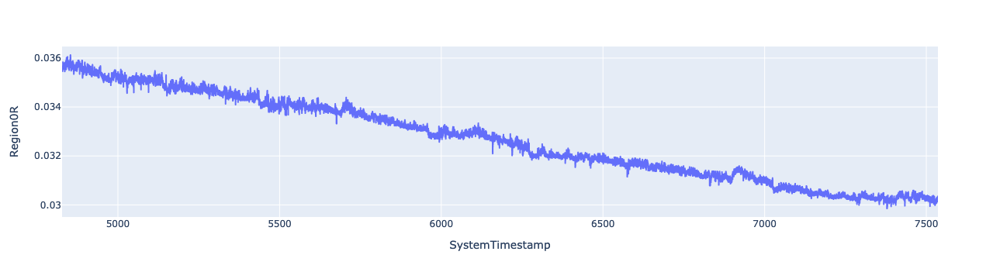

In [496]:
import plotly.express as px
region0R_red = df[df.wave_len == 560][['SystemTimestamp', 'Region0R']]
px.line(region0R_red, x='SystemTimestamp', y='Region0R')

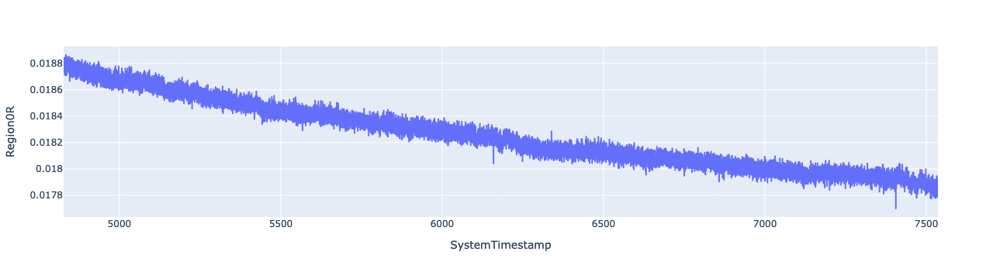

In [497]:
region0R_iso = df[df.wave_len == 410][['SystemTimestamp', 'Region0R']]
px.line(region0R_iso, x='SystemTimestamp', y='Region0R')

In [461]:
#import numpy as np
#region0R_iso.drop(region0R_iso.tail(1).index, inplace=True)
referenceR=region0R_iso.Region0R.to_numpy()
#region0R_red.drop(region0R_red.head(1).index, inplace=True)
region0R_red.drop(region0R_red.tail(1).index, inplace=True)
signalR=region0R_red.Region0R.to_numpy()
z_referenceR = (referenceR - np.median(referenceR)) / np.std(referenceR)
z_signalR = (signalR - np.median(signalR)) / np.std(signalR)

In [462]:
from sklearn.linear_model import Lasso
lin = Lasso(alpha=0.0001,precompute=True,max_iter=1000,
            positive=True, random_state=9999, selection='random')
n = len(z_referenceR)
lin.fit(z_referenceR.reshape(n,1), z_signalR.reshape(n,1))

Lasso(alpha=0.0001, positive=True, precompute=True, random_state=9999,
      selection='random')

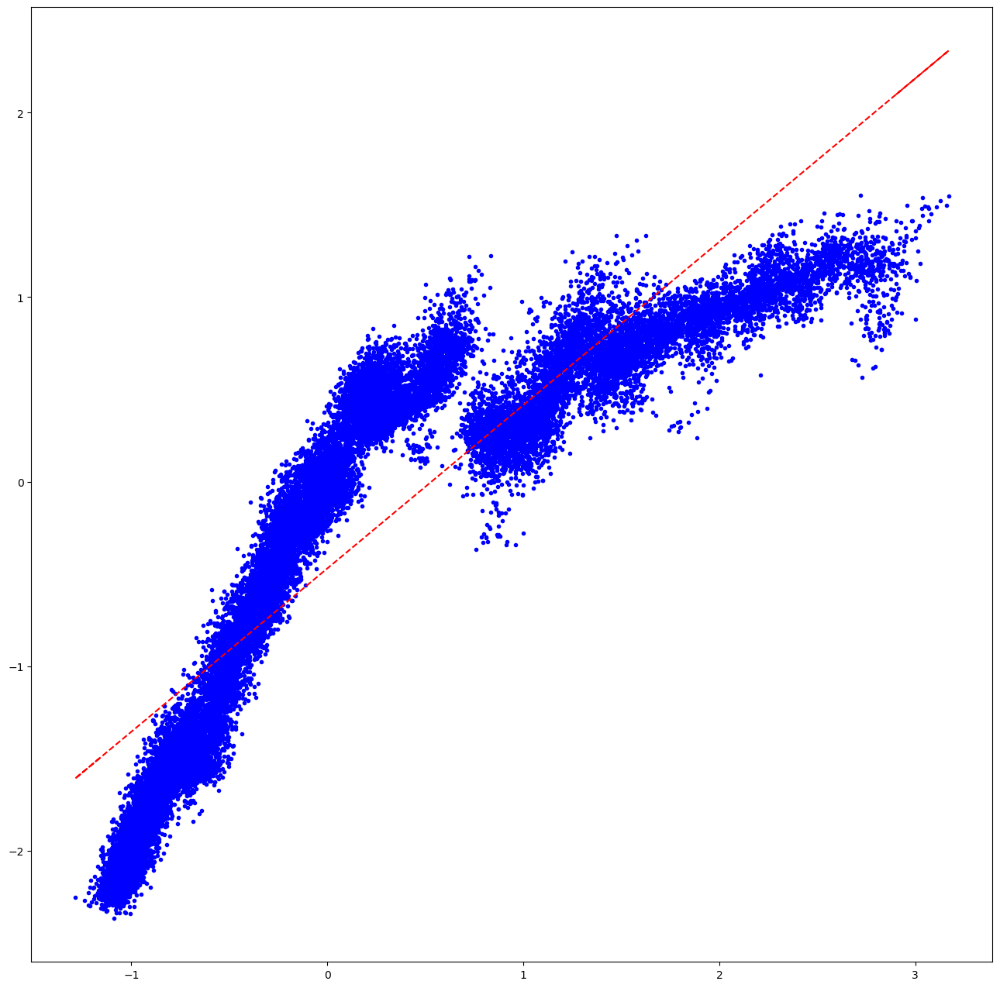

In [463]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(111)
ax1.plot(z_referenceR,z_signalR,'b.')
z_referenceR_fitted = lin.predict(z_referenceR.reshape(n,1)).reshape(n,)
ax1.plot(z_referenceR,z_referenceR_fitted, 'r--',linewidth=1.5)

In [464]:
region1G_green = df[df.wave_len == 470][['SystemTimestamp', 'Region1G']]
px.line(region1G_green, x='SystemTimestamp', y='Region1G')

KeyError: "['Region1G'] not in index"

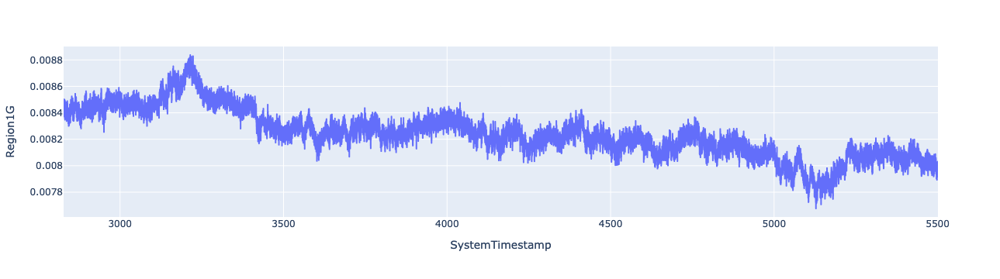

In [396]:
region1G_iso = df[df.wave_len == 410][['SystemTimestamp', 'Region1G']]
px.line(region1G_iso, x='SystemTimestamp', y='Region1G')

In [399]:
region1G_iso.drop(region1G_iso.tail(1).index, inplace=True)
referenceG=region1G_iso.Region1G.to_numpy()
#region1G_green.drop(region1G_green.tail(1).index, inplace=True)
signalG=region1G_green.Region1G.to_numpy()
z_referenceG = (referenceG - np.median(referenceG)) / np.std(referenceG)
z_signalG = (signalG - np.median(signalG)) / np.std(signalG)

In [400]:
from sklearn.linear_model import Lasso
lin = Lasso(alpha=0.0001,precompute=True,max_iter=1000,
            positive=True, random_state=9999, selection='random')
n = len(z_referenceG)
lin.fit(z_referenceG.reshape(n,1), z_signalG.reshape(n,1))

Lasso(alpha=0.0001, positive=True, precompute=True, random_state=9999,
      selection='random')

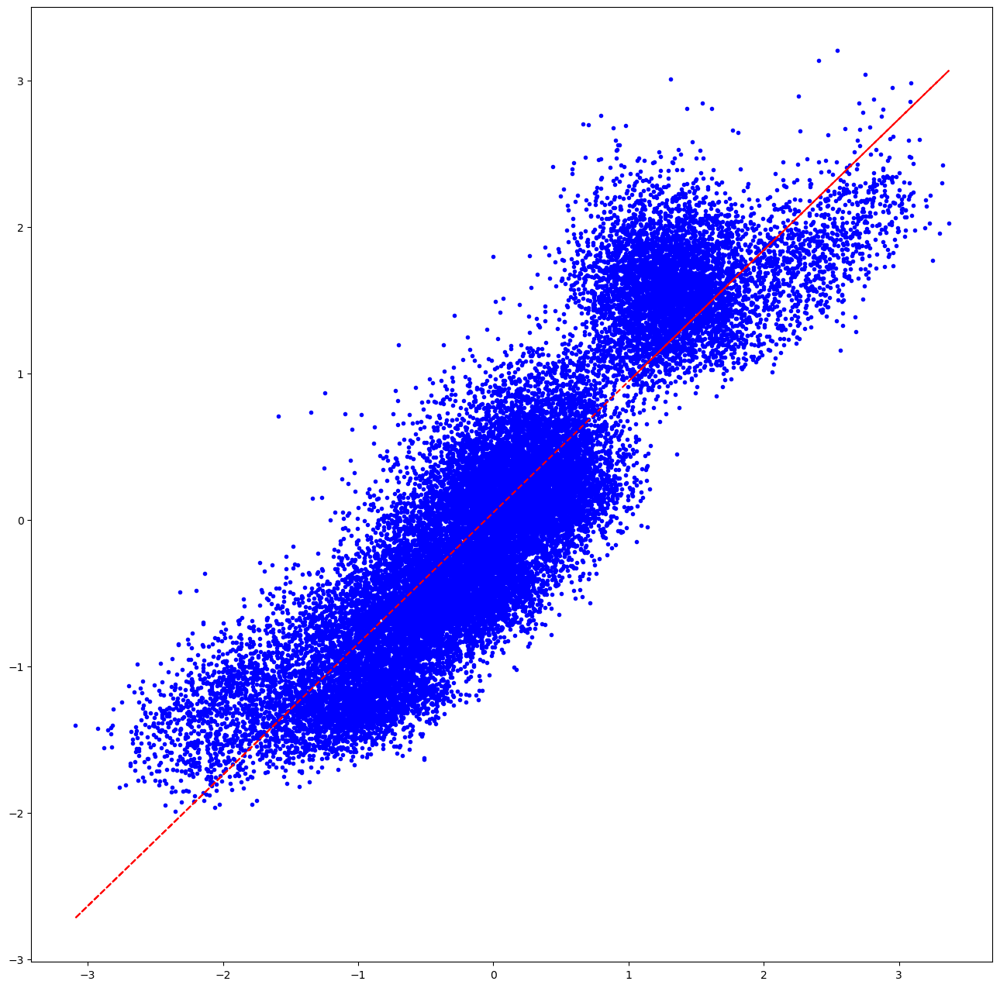

In [401]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(111)
ax1.plot(z_referenceG,z_signalG,'b.')
z_referenceG_fitted = lin.predict(z_referenceG.reshape(n,1)).reshape(n,)
ax1.plot(z_referenceG,z_referenceG_fitted, 'r--',linewidth=1.5)
#ax1.set_xlim(-1,3)
#ax1.set_ylim(-1,2)

Fiber Photometry does not measure the difference between day and night. Changes in fluorescence are usually extremely small and very hard to measure, and are conventionally expressed as dF/F, the ratio of the change in fluorescence divided by the baseline fluorescence. We basically measure light intensity with a super high precision. However, this means that the photometry system will also pick up every disturbance, even if very small.

Examples of unwanted noise are:
* Photobleaching of the patch cable
* Photobleaching caused by LED heating
* Photobleaching of the sensors
* Motion artifacts
* Loose, poorly attached, and/or twisted cables

![grafik.png](attachment:grafik.png)

## Preprocessing of Fiber Photometry Data

As we saw, the raw data is useless without further processing. There are a variety of different of different methods to remove photobleaching and motion artifacts, here are a few examples:

### Correction of Photobleaching:

* High-Pass Filtering: Photobleaching usually occurs at a very slow timescale. By applying a simple high-pass filter, e.g. a butterworth, it is possible to remove the gross artifacts of photobleaching, but it removes also slow changes in neurotransmitter concentration
* Biexponential decay: Photobleaching can be estimated by a decreasing exponential function. However, as it happens on two different timescales (e.g. fast LED-heating-based photobleaching and slow patch chord photobleaching), we need a biexponential decay that can be regressed to the data and then subtracted.
* airPLS: Adaptive iteratively reweighted penalized least squares. A more advanced method to remove artifacts. For more info, please see the paper: DOI: 10.1039/b922045c

### Correction of Motion Artifacts:

* Genetically encoded fluorescent biosensors generally have a point in the spectrum at which the amount of fluorescence stimulated by excitation is independent of ligand binding, which is defined as the isosbestic point. For example, the isosbestic pont of GCaMP6 is around 410 nm (instead of e.g. 470 or 560), so this was selected as the isosbestic excitation wavelength for the NPM system. The isobestic is useful as a control to correct motion artifacts.
* If a transient is caused by neural activity, it should be detectable in the signal channel, but not in the control (e.g. isosbestic) channel, as long as the isosbestic point of the sensor is close to the wavelength used for isosbestic stimulation. If it is caused by motion, it should be detectable in both the isobestic and signal channels. 
* We can remove motion artifacts if we fit the isobestic to the signal and subtract.

## Demodulate using airPLS

We can use fibermagic to calculate z-scores of dF/F using the airPLS algorithm. However, before we do that, we need to bring the dataframe into long-format.

In [402]:
df.head(10)

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G,R2,G3,wave_len
1888,1888,2827.456608,4,71963634.97,0.036753,0.938663,0.013141,0.730546,560.0
1889,1889,2827.489952,1,71963668.98,0.009794,0.008417,0.008566,0.003922,410.0
1890,1890,2827.523264,2,71963701.99,0.007172,0.015547,0.003922,0.005987,470.0
1891,1891,2827.556608,4,71963735.00,0.036408,0.938663,0.013199,0.730492,560.0
1892,1892,2827.589920,1,71963769.00,0.009741,0.008454,0.008560,0.003922,410.0
1893,1893,2827.623264,2,71963802.01,0.007178,0.015548,0.003922,0.005997,470.0
1894,1894,2827.656608,4,71963835.02,0.036595,0.938665,0.013105,0.730641,560.0
1895,1895,2827.689920,1,71963869.02,0.009788,0.008444,0.008544,0.003922,410.0
1896,1896,2827.723264,2,71963902.03,0.007197,0.015556,0.003922,0.006000,470.0
1897,1897,2827.756608,4,71963935.04,0.036836,0.938651,0.013138,0.730649,560.0


In [403]:
NPM_RED = 560
NPM_GREEN = 470
NPM_ISO = 410
# dirty hack to come around dropped frames until we find better solution -
# it makes about 0.16 s difference
#df = df.iloc[0:]
df.FrameCounter = np.arange(0, len(df)) // len(df.wave_len.unique())
df = df.set_index('FrameCounter')
df.head(5)

,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G,R2,G3,wave_len
FrameCounter,,,,,,,,
0,2827.456608,4,71963634.97,0.036753,0.938663,0.013141,0.730546,560.0
0,2827.489952,1,71963668.98,0.009794,0.008417,0.008566,0.003922,410.0
0,2827.523264,2,71963701.99,0.007172,0.015547,0.003922,0.005987,470.0
1,2827.556608,4,71963735.00,0.036408,0.938663,0.013199,0.730492,560.0
1,2827.589920,1,71963769.00,0.009741,0.008454,0.008560,0.003922,410.0


In [404]:
regions = [column for column in df.columns if 'Region' in column]
dfs = list()
for region in regions:
    channel = NPM_GREEN if 'G' in region else NPM_RED
    sdf = pd.DataFrame(data={
        'Region': region,
        'Channel': channel,
        'Timestamp': df.SystemTimestamp[df.wave_len == channel],
        'Signal': df[region][df.wave_len == channel],
        'Reference': df[region][df.wave_len == NPM_ISO]
    }
    )
    dfs.append(sdf)
dfs = pd.concat(dfs).reset_index().set_index('Region').dropna()
dfs

,FrameCounter,Channel,Timestamp,Signal,Reference
Region,,,,,
Region0R,0,560,2827.456608,0.036753,0.009794
Region0R,1,560,2827.556608,0.036408,0.009741
Region0R,2,560,2827.656608,0.036595,0.009788
Region0R,3,560,2827.756608,0.036836,0.009791
Region0R,4,560,2827.856576,0.036567,0.009720
...,...,...,...,...,...
Region1G,26731,470,5500.533184,0.014319,0.008021
Region1G,26732,470,5500.633184,0.014285,0.007970
Region1G,26733,470,5500.733152,0.014203,0.007987


In [405]:
dfs2 = dfs

In [22]:
from functools import partial

import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from scipy.sparse import csc_matrix, eye, diags
from scipy.sparse.linalg import spsolve

from tqdm.auto import tqdm

tqdm.pandas()


def demodulate(
    data=None,
    timestamps=None,
    signal=None,
    isosbestic=None,
    by=None,
    steps=False,
    method="airPLS",
    smooth=None,
    standardize=False,
    **kwargs
):
    """
    High-level function to demodulate signal

    Supports two methods for baseline correction: airPLS and biexponential decay.

    If isosbestic is given, performs artifact removal using the isosbestic signal

    Parameters
    ----------
    data : pd.DataFrame or dict
        raw data to demodulate, if None, timestamps, signal and isosbestic must be provided as array-like
    timestamps : str or array-like
        the array with timestamps; if str, it is the name of the column in data
        the column with timestamps or the timestamps themselves
    signal : str or array-like
        the column with signal; if str, it is the name of the column in data
        the column with signal or the signal itself
    isosbestic : str or array-like
        the column with isosbestic signal; if str, it is the name of the column
        in data the column with isosbestic signal or the isosbestic signal itself
    by : str or list
        with column names to group by or array-like with group labels, has to be the same length as
        the data
        divides the data into groups and demodulates each group separately, typically you should pass enough
        columns to uniquely identify each session
    steps : bool
        if True, returns intermediate steps as a pd.DataFrame
    method : str
        method to use for demodulation, one of [airPLS, biexponential decay] or None if only artifact removal
        is needed
    smooth : int or None
        length of the smoothing moving average window; used to smooth the signal and isosbestic before demodulation
    standardize: bool
        if True, calculates z-scores from the dFF after demodulation and artifact removal
    kwargs : dict
        parameters for airPLS or biexponential decay.

        For airPLS:
        lambda: parameter for airPLS; The larger lambda is, the smoother the resulting background
        porder: parameter for airPLS; adaptive iteratively reweighted penalized least squares for baseline fitting
        itermax: parameter for airPLS; maximum number of iterations
        lambda_artifact: parameter for artifact removal; The larger lambda is, the smoother the resulting
        background
        porder_artifact: parameter for artifact removal; adaptive iteratively reweighted penalized least squares
        for
        baseline fitting
        itermax_artifact: parameter for artifact removal; maximum number of iterations

    Returns
    -------
    pd.DataFrame or pd.Series with the demodulated signal

    """

    demodulator = _Demodulator(
        data=data,
        timestamps=timestamps,
        signal=signal,
        isosbestic=isosbestic,
        by=by,
        steps=steps,
        method=method,
        smooth=smooth,
        standardize=standardize,
        **kwargs,
    )

    return demodulator()


class _Demodulator:
    def __init__(
        self,
        data=None,
        timestamps=None,
        signal=None,
        isosbestic=None,
        by=None,
        steps=False,
        method="biexponential decay",
        smooth=None,
        standardize=False,
        **kwargs
    ):

        self.timestamp = timestamps
        self.signal = signal
        self.isosbestic = isosbestic

        # convert input to a common representation
        # check if type of data is a pd.DataFrame
        if not isinstance(data, pd.DataFrame):
            if data:  # then it must be a dict and/or data are provided as an array
                timestamps = data.get(timestamps, timestamps)
                signal = data.get(signal, signal)
                isosbestic = data.get(isosbestic, isosbestic)

                if isinstance(by, str):
                    by_data = data.get(by, by)
                elif isinstance(by, list):
                    by_data = [data.get(x, x) for x in by]

            if any([type(x) == str for x in [timestamps, signal, isosbestic]]):
                raise ValueError("If data is not provided, timestamps, signal and isosbestic must be array-like")
            if by:
                data = pd.DataFrame(
                    {
                        "timestamps": timestamps,
                        "signal": signal,
                        "isosbestic": isosbestic,
                        **dict(zip(by, by_data)),
                    }
                )
            else:
                data = pd.DataFrame({"timestamps": timestamps, "signal": signal, "isosbestic": isosbestic})
        else:
            # check if column names is exists if they are not None
            if type(timestamps) == str and timestamps not in data.columns:
                raise ValueError("timestamps column not found in data")
            else:
                data = data.rename({timestamps: "timestamps"}, axis=1)
            if type(signal) == str and signal not in data.columns:
                raise ValueError("signal column not found in data")
            else:
                data = data.rename({signal: "signal"}, axis=1)
            if type(isosbestic) == str and isosbestic not in data.columns:
                raise ValueError("isosbestic column not found in data")
            else:
                data = data.rename({isosbestic: "isosbestic"}, axis=1)
        # check if by is a string or list of strings, all of which are in data.columns
        if by:
            if type(by) == str:
                if by not in data.columns:
                    raise ValueError("per column not found in data")
            elif type(by) == list:
                if any([x not in data.columns and x not in data.index.names for x in by]):
                    raise ValueError("per column not found in data")
            else:
                by = np.asarray(by)
                # check if len of per is equal to len of data
                if by and len(by) != len(data):
                    raise ValueError("per must be the same length as data")

        self.steps = steps
        self.method = method
        self.data = data

        self.by = by
        if by:
            # count number of unique groups in by columns
            # if only one group, set by to None to not groupby
            n_groups = len(data.groupby(by=by).groups)
            if n_groups == 1:
                self.by = None
        self.smooth = smooth
        self.standardize = standardize

        # set parameters
        self.lambda_ = kwargs.get("lambda", 5e4)
        self.porder = kwargs.get("porder", 1)
        self.itermax = kwargs.get("itermax", 50)

        self.lambda_artifact = kwargs.get("lambda_artifact", 1e4)
        self.porder_artifact = kwargs.get("porder_artifact", 1)
        self.itermax_artifact = kwargs.get("itermax_artifact", 50)

    def __call__(self):
        # select the correct method given the input and run it

        # if method None, only artifact removal
        if not self.method:
            if self.data.isosbestic is None:
                raise ValueError("isosbestic must be provided for artifact removal")
            method = self.remove_artifact

        # if no isosbestic is provided, only demodulate, no artifact removal
        if self.isosbestic is None:
            if self.method == "airPLS":
                method = self.demodulate_with_airPLS
            elif self.method == "biexponential decay":
                method = self.demodulate_with_biexponential_decay
        # if isosbestic is provided, demodulate and remove artifact
        else:
            if self.method == "airPLS":
                method = self.demodulate_with_airPLS_and_remove_artifact
            elif self.method == "biexponential decay":
                method = self.demodulate_with_biexponential_decay_and_remove_artifact

        def smooth(method, data):
            data.signal = data.signal.rolling(self.smooth, center=True, min_periods=1).mean()
            if self.isosbestic:
                data.isosbestic = data.isosbestic.rolling(self.smooth, center=True, min_periods=1).mean()
            return method(data)

        if self.smooth:
            method = partial(smooth, method)

        def z_score(method, data):
            # perform demodulation and artifact removal first
            data = method(data)

            # then, simply calculate z-scores
            if isinstance(data, pd.DataFrame):  # this is the case if steps is True
                data["zdFF"] = (data.dFF - data.dFF.median()) / data.dFF.std()
            else:  # if steps is False, data is a series
                data = (
                    data - data.median()
                ) / data.std()  # use median instead of mean to be robust to big transients
            return data

        if self.standardize:
            method = partial(z_score, method)

        if not self.by:
            return method(self.data)
        # don't sort and return index, because it should be possible to assign the result to the original index
        r = self.data.groupby(self.by, sort=False, as_index=False).progress_apply(method)
        if isinstance(r, pd.DataFrame) and len(r.columns.names) == 1:
            column_name = r.columns.names[0]
            r = r.stack()  # because progress_apply returns a df with one column not a series
            r.name = column_name
        return r.reset_index(level=0, drop=True)

    def demodulate_with_airPLS_and_remove_artifact(self, data):
        """
        Demodulate signal using airPLS and remove artifact

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        result = self.demodulate_with_airPLS(data)
        signal = result["dFF"] if self.steps else result

        # pass demodulated signal to remove artifact on this one, not on the original signal
        result = self.remove_artifact(data, signal)
        return result

    def demodulate_with_biexponential_decay_and_remove_artifact(self, data):
        """
        Demodulate signal using biexponential decay and remove artifacts using isosbestic

        First, dFF is calculated using biexponential decay.

        Then, artifact is removed by aligning, scaling and subtracting isosbestic signal.
        To align isosbestic signal, airPLS is used.

        Parameters
        ----------
        data: pd.DataFrame
            with columns signal and isosbestic

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        result = self.demodulate_with_biexponential_decay(data)
        signal = result["dFF"] if self.steps else result

        # pass demodulated signal to remove artifact on this one, not on the original signal
        result = self.remove_artifact(data, signal)
        return result

    def remove_artifact(self, data, artifact_signal=None):
        """
        Remove artifact from signal by scaling and subtracting isosbestic signal

        Parameters
        ----------
        data: pd.DataFrame with columns signal and isosbestic
        artifact_signal: pd.DataFrame, optional, default: None
            if given, use this signal for artifact removal instead of data.signal

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        if artifact_signal is None:
            artifact_signal = data.signal

        # test if len of data and artifact_signal are equal
        if len(data) != len(artifact_signal):
            raise ValueError("data and artifact_signal must have the same length")

        data["isosbestic_airPLS_baseline"] = self.airPLS(
            data.isosbestic.to_numpy(),
            lambda_=self.lambda_artifact,
            porder=self.porder_artifact,
            itermax=self.itermax_artifact,
        )
        data["signal_airPLS_baseline"] = self.airPLS(
            artifact_signal.to_numpy(),
            lambda_=self.lambda_artifact,
            porder=self.porder_artifact,
            itermax=self.itermax_artifact,
        )

        data["signal_wo_slope"] = artifact_signal - data.signal_airPLS_baseline
        data["isosbestic_wo_slope"] = data.isosbestic - data.isosbestic_airPLS_baseline

        data["isosbestic_wo_slope"] = (
            data.isosbestic_wo_slope - data.isosbestic_wo_slope.median()
        ) / data.isosbestic_wo_slope.std()

        # Align reference signal to calcium signal using non-negative robust linear regression
        lin = Lasso(
            alpha=0.0001,
            precompute=True,
            max_iter=1000,
            positive=True,
            random_state=9999,
            selection="random",
        )

        # zero-center both signals
        data["isosbestic_centered"] = data.isosbestic_wo_slope - data.isosbestic_wo_slope.median()
        data["signal_centered"] = data.signal_wo_slope - data.signal_wo_slope.median()

        n = len(data.isosbestic_centered)
        lin.fit(data.isosbestic_centered.to_numpy().reshape(n, 1), data.signal_centered.to_numpy().reshape(n, 1))
        data["isosbestic_fit"] = lin.predict(data.isosbestic_centered.to_numpy().reshape(n, 1)).reshape(
            n,
        )

        data["signal_wo_artifacts"] = artifact_signal - data.isosbestic_fit

        if self.steps:
            return data
        return data.signal_wo_artifacts

    def demodulate_with_airPLS(self, data):
        """
        Low-level function to demodulate signal using airPLS; estimates a baseline and calculates dFF
        Parameters
        ----------
        data
            pd.DataFrame with raw signal and timestamps

        Returns
        -------
        pd.Series with demodulated signal or df with intermediate steps as additional columns

        """
        # Remove slope using airPLS algorithm
        data["baseline_fit"] = self.airPLS(data.signal, self.lambda_, self.porder, self.itermax)
        if any(data.baseline_fit <= 0):
            raise ValueError(
                "Negative or zero values in baseline fit, try to decrease lambda_, check if there is "
                "any fluorescence (if your measured values are very close to zero, there might not be)"
            )
            
        data["dFF"] = (data.signal - data.baseline_fit) / data.baseline_fit
        
        #data["dFF"] = data.signal/data.baseline_fit

        if self.steps:
            return data
        return data.dFF

    def demodulate_with_biexponential_decay(self, data):
        """
        Low-level function to demodulate signal using biexponential decay

        Parameters
        ----------
        data: pd.DataFrame
            with raw signal and timestamps

        Returns
        -------
        pd.Series with demodulated signal or df with intermediate steps as additional columns

        """

        def func(x, a, b, c, d, e):
            return a * np.exp(-b * x) + c * np.exp(-d * x) + e

        x = data.timestamps
        y = data.signal
        maxfev = 20000

        # often, long recordings fail to converge with the default parameters
        # but with a good initialization, they converge
        # most recordings should converge with one of the following initializations
        p0_hypotheses = [
            (0.0001444429, 0.0001258, 0.00267557, 0.000357409, 0.00302242),
            (0.0001, 1e-2, 0.0001, 0.0001, 0.01),
            (0.01444429, 0.0001258, 0.00267557, 0.00357409, 0.00302242),
            (2.40565424e-03, 2.17178810e-03, 4.26379890e-02, 5.10966801e-05, -2.27121348e-02),
            (0.00555751, 0.00044251, 0.00192142, 0.00044231, 0.0094028),
            (2.91087378e-02, 9.59886404e-05, 4.50395693e-03, 1.71131354e-03, -3.08947780e-03),
            (0.01943434, 0.00030113, 0.00312723, 0.00311773, 0.01080267),
            (-2.00141250e-11, -4.63104530e-03, 1.12415216e-02, 5.18970857e-04, 1.54544995e-02),
            (0.01258999, 0.000377, 0.00291031, 0.00311715, 0.00720046),
            (0.1, 0.1, 0.1, 0.1, 0.012),
        ]
        for p0_hypothesis in p0_hypotheses:
            popt, pcov = curve_fit(func, x, y, p0=p0_hypothesis, maxfev=maxfev)
            if any(popt > 0.05):
                print("Curve fit didn't converge! Trying different initialization...")
            else:
                break
        if any(popt > 0.05):
            print("final parameters are still unrealistic :(")
        else:
            print(popt)

        data["exponential_decay"] = func(x, *popt)

        data["dFF"] = (data.signal - data.exponential_decay) / data.exponential_decay

        if self.steps:
            return data
        return data.dFF

    @staticmethod
    def smooth_signal(x, window_len=10, window="flat"):
        """
        smooth the data using a window with requested size.
        This method is based on the convolution of a scaled window with the signal.
        The signal is prepared by introducing reflected copies of the signal
        (with the window size) in both ends so that transient parts are minimized
        in the begining and end part of the output signal.
        The code taken from: https://scipy-cookbook.readthedocs.io/items/SignalSmooth.html
        :param x: np array, the input signal
        :param window_len: the dimension of the smoothing window; should be an odd integer
        :param window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
                    'flat' window will produce a moving average smoothing.
        :return: array, the smoothed signal
        """

        x = np.array(x)

        if x.ndim != 1:
            raise (ValueError, "smooth only accepts 1 dimension arrays.")

        if x.size < window_len:
            raise (ValueError, "Input vector needs to be bigger than window size.")

        if window_len < 3:
            return x

        if window not in ["flat", "hanning", "hamming", "bartlett", "blackman"]:
            raise (
                ValueError,
                "Window is one of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'",
            )

        s = np.r_[x[window_len - 1 : 0 : -1], x, x[-2 : -window_len - 1 : -1]]

        if window == "flat":  # Moving average
            w = np.ones(window_len, "d")
        else:
            w = eval("np." + window + "(window_len)")

        y = np.convolve(w / w.sum(), s, mode="valid")

        y = y[(int(window_len / 2) - 1) : -int(window_len / 2)]
        if len(x) != len(y):
            y = y[: len(x)]
        return y

    """
    Ocober 2019 Ekaterina Martianova ekaterina.martianova.1@ulaval.ca

    Reference:
      (1) Martianova, E., Aronson, S., Proulx, C.D. Multi-Fiber Photometry
          to Record Neural Activity in Freely Moving Animal. J. Vis. Exp.
          (152), e60278, doi:10.3791/60278 (2019)
          https://www.jove.com/video/60278/multi-fiber-photometry-to-record-neural-activity-freely-moving

    airPLS.py Copyright 2014 Renato Lombardo - renato.lombardo@unipa.it
    Baseline correction using adaptive iteratively reweighted penalized least squares

    This program is a translation in python of the R source code of airPLS version 2.0
    by Yizeng Liang and Zhang Zhimin - https://code.google.com/p/airpls

    Reference:
    Z.-M. Zhang, S. Chen, and Y.-Z. Liang, Baseline correction using adaptive iteratively
    reweighted penalized least squares. Analyst 135 (5), 1138-1146 (2010).

    LICENCE
    This program is free software: you can redistribute it and/or modify
    it under the terms of the GNU Lesser General Public License as published by
    the Free Software Foundation, either version 3 of the License, or
    (at your option) any later version.
    """

    @staticmethod
    def whittaker_smooth(x, w, lambda_, differences=1):
        """
        Penalized least squares algorithm for background fitting
            :param x: input data (i.e. chromatogram of spectrum)
            :param w: binary masks (value of the mask is zero if a point belongs to peaks and one otherwise)
            :param lambda_: parameter that can be adjusted by user. The larger lambda is,
                     the smoother the resulting background
            :param differences: integer indicating the order of the difference of penalties
            :return: np array of whittaker smooth
        """

        x = np.array(x)
        w = np.array(w)

        X = np.matrix(x)
        m = X.size
        E = eye(m, format="csc")
        D = E[1:] - E[:-1]  # numpy.diff() does not work with sparse matrix. This is a workaround.
        W = diags(w, 0, shape=(m, m))
        A = csc_matrix(W + (lambda_ * D.T * D))
        B = csc_matrix(W * X.T)
        background = spsolve(A, B)
        return np.array(background)

    @staticmethod
    def airPLS(x, lambda_=1e4, porder=1, itermax=50):
        """
        Adaptive iteratively reweighted penalized least squares for baseline fitting
            :param x: input data (i.e. chromatogram of spectrum)
            :param lambda_: parameter that can be adjusted by user. The larger lambda is,
                     the smoother the resulting background, z
            :param porder: adaptive iteratively reweighted penalized least squares for baseline fitting
            :param itermax: maximal amount of iterations
            :return: the fitted background vector
        """
        # convert to numpy docstring

        x = np.array(x)

        m = x.shape[0]
        w = np.ones(m)
        if itermax < 1:
            raise ValueError("itermax must be a positive integer")
        for i in range(1, itermax + 1):
            z = _Demodulator.whittaker_smooth(x, w, lambda_, porder)
            d = x - z
            dssn = np.abs(d[d < 0].sum())
            if dssn < 0.001 * (abs(x)).sum() or i == itermax:
                if i == itermax:
                    print("WARING max iteration reached!")
                break
            w[
                d >= 0
            ] = 0  # d>0 means that this point is part of a peak, so its weight is set to 0 in order to ignore it
            w[d < 0] = np.exp(i * np.abs(d[d < 0]) / dssn)
            w[0] = np.exp(i * (d[d < 0]).max() / dssn)
            w[-1] = w[0]
        return z

if __name__ == "__main__":
    #df = pd.read_csv("example_data.csv")
    #dfsz.Signal -= 1 / 255
    #dfsz.Reference -= 1 / 255
    # ex = df[(df.injection=='baseline') & (df.mouse=='A1') & (df.Channel==560)].copy()
    #dfsz.Signal = dfsz.Signal.rolling(8, center=True, min_periods=1).mean()
    #dfsz.Reference = dfsz.Reference.rolling(8, center=True, min_periods=1).mean()

    # plt.plot(ex.index, ex.Signal)
    # plt.show()
    # get df column names
    res = demodulate(
        **dict(
            data={
                "timestamps": [1, 2, 3, 4, 5],
                "signal": [1, 2, 3, 4, 5],
            },
            timestamps="timestamps",
            signal="signal",
        ),
    )
    #df = df.set_index(["injection", "mouse"])
    dfs2["dFF"] = demodulate(
        dfs2, "Timestamp", "Signal", "Reference", "Channel", method="airPLS", smooth=10,
    )

    print("halt")

WARING max iteration reached!


  0%|          | 0/2 [00:00<?, ?it/s]

halt


In [406]:
dfs2 = dfs
dfs2["zdFF"] = demodulate(dfs2, "Timestamp", "Signal", "Reference", "Channel", steps=False, method="airPLS", smooth=10, standardize=True)

  0%|          | 0/2 [00:00<?, ?it/s]

In [407]:
dfs2

,FrameCounter,Channel,Timestamp,Signal,Reference,zdFF
Region,,,,,,
Region0R,0,560,2827.456608,0.036753,0.009794,1.148032
Region0R,1,560,2827.556608,0.036408,0.009741,0.938085
Region0R,2,560,2827.656608,0.036595,0.009788,0.769821
Region0R,3,560,2827.756608,0.036836,0.009791,0.319385
Region0R,4,560,2827.856576,0.036567,0.009720,-0.001822
...,...,...,...,...,...,...
Region1G,26731,470,5500.533184,0.014319,0.008021,-0.633024
Region1G,26732,470,5500.633184,0.014285,0.007970,-0.578634
Region1G,26733,470,5500.733152,0.014203,0.007987,-0.608511


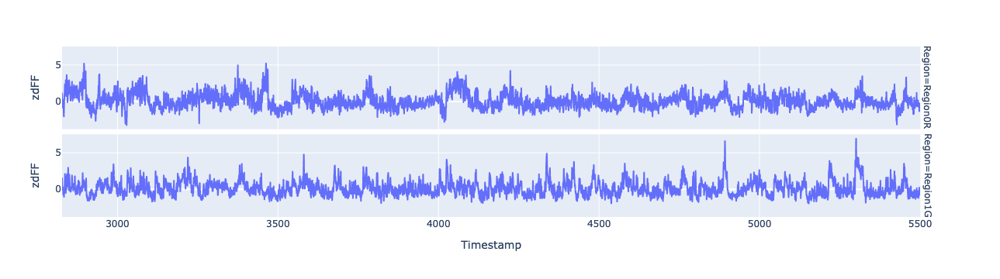

In [408]:
px.line(dfs2.reset_index(), x='Timestamp', y='zdFF', facet_row='Region')

## Analyzing Behavioral Data

In most experiments, we want to collect behavioral data along with the neural data. We then want to correlate behavior with our neural recording. For example, the animal might perform a lever pressing task in an operant box. The operant box collects data about the time when the lever is pressed and when a food reward is delivered.

Let's have a look into the log file produced by the operant box:

In [409]:
#logs = pd.read_csv('raw data/NAcC rAdo1.3 + iSPN GCaMP8m PR/PR8/B1206/logs.csv')
#logs.columns = ['ComputerTimestamp', 'SystemTimestamp', 'animal.ID', 'Event', 'pi.time', 'pc.time', 'datetimestamp']
#logs = logs[logs['animal.ID']=='B1206']
logs = logs.reset_index(drop=True)
logs = logs.rename(columns={'SystemTimestamp':'Timestamp'})

As we see, the "Event" column records the type of event (e.g. left lever pressed; food delivered, etc...). If we are interested in higher-order patterns of behavior across the session, such as bouts of lever pressing, we can analyze them before synchronization with the photometry data so that information is included in the synchronization file. The following code identifies bouts of a user-specified event in the log file. In this example, the threshold for bouts is chosen by the user. 

In [410]:
import glob
bout_threshold = 5
bouts = copy.deepcopy(logs)
#bouts = bouts[bouts['Event'] == 'RL'].reset_index(drop=True)
bouts['inter'] = bouts[bouts['Event'] == active_lever]['Timestamp'].diff().fillna(bouts[bouts['Event'] == active_lever]['Timestamp'])
#bouts.loc[0, 'inter'] = 0
bouts['bout'] = np.where(bouts['inter'] >= bout_threshold, 1, 0)
#bouts.loc[0, 'bout'] = 1
bouts['lever_bout'] = bouts['bout'].cumsum()
bouts['lever_number'] = bouts[bouts['Event'] == active_lever].groupby('animal.ID').cumcount() + 1
bouts['count'] = bouts[bouts['Event'] == active_lever].groupby('lever_bout')['lever_number'].transform('size')
bouts['Cum_lever_bouts'] = bouts[bouts['Event'] == active_lever].groupby(['animal.ID','lever_bout']).cumcount() + 1
bout_start_rows = bouts[bouts['bout'] == 1].copy()
bout_start_rows['Event'] = 'BS'
bout_start_rows['Timestamp'] = bout_start_rows['Timestamp'] - 0.0001
bouts = pd.concat([bouts, bout_start_rows], ignore_index=True)
bouts = bouts.sort_values(by='Timestamp').reset_index(drop=True)
bout_end_rows = bouts[bouts['Event']== active_lever].groupby('lever_bout').tail(1).copy()
bout_end_rows['Event'] = 'BE'
bout_end_rows['Timestamp'] = bout_end_rows['Timestamp'] + 0.0001
#bouts['inter'] = bouts.groupby('animal.ID')['inter'].apply(lambda x: x.mask(x.index == x.idxmin(), 0))
bouts = pd.concat([bouts, bout_end_rows], ignore_index=True)
bouts = bouts.sort_values(by='Timestamp').reset_index(drop=True)
bouts#[bouts['Event'] == 'BS']

,ComputerTimestamp,Timestamp,animal.ID,Event,pi.time,pc.time,datetimestamp,inter,bout,lever_bout,lever_number,count,Cum_lever_bouts
0,7.193324e+07,2797.095488,B1068,video_start,-1.000000e+00,1.708304e+09,2024-02-19 00:58:53.233875+00:00,NaN,0,0,NaN,NaN,NaN
1,7.196359e+07,2827.437600,B1068,LL,1.704104e+09,1.708304e+09,2024-02-19 00:59:23.581959+00:00,NaN,0,0,NaN,NaN,NaN
2,7.197335e+07,2837.199548,B1068,BS,1.704104e+09,1.708304e+09,2024-02-19 00:59:33.343977+00:00,2837.199648,1,1,1.0,1.0,1.0
3,7.197335e+07,2837.199648,B1068,RL,1.704104e+09,1.708304e+09,2024-02-19 00:59:33.343977+00:00,2837.199648,1,1,1.0,1.0,1.0
4,7.197335e+07,2837.199748,B1068,BE,1.704104e+09,1.708304e+09,2024-02-19 00:59:33.343977+00:00,2837.199648,1,1,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,7.444581e+07,5309.386908,B1068,BS,1.704107e+09,1.708307e+09,2024-02-19 01:40:45.493017+00:00,186.161408,1,34,69.0,2.0,1.0
182,7.444581e+07,5309.387008,B1068,RL,1.704107e+09,1.708307e+09,2024-02-19 01:40:45.493017+00:00,186.161408,1,34,69.0,2.0,1.0
183,7.444609e+07,5309.672992,B1068,RL,1.704107e+09,1.708307e+09,2024-02-19 01:40:45.779083+00:00,0.285984,0,34,70.0,2.0,2.0
184,7.444609e+07,5309.673092,B1068,BE,1.704107e+09,1.708307e+09,2024-02-19 01:40:45.779083+00:00,0.285984,0,34,70.0,2.0,2.0


In [411]:
bouts.to_csv('B1206PR11ALbout5.csv')

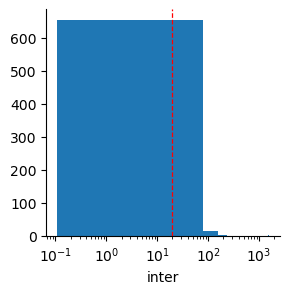

In [28]:
import seaborn as sns
g = sns.FacetGrid(bouts, margin_titles=True)
g.map(plt.hist, 'inter', bins=20)
g.map(plt.axvline, x=bout_threshold, ls='--', lw=0.9, color='red')
plt.xscale('log')
plt.show()

## Synchronizing Behavioral Data

There are a variety of possibilities how to synchronize the logs with the FP data. The most commonly used method is to use a timestamp that is common to both the photometry and behavioral data, such as the clock of the laptop that runs Bonsai (ComputerTimestamp), or the NPM system clock (SystemTimestamp). 

In another case, an external generator generates a TTL pulse every 100 ms. The TTL pulse is captured by the operand box and logged as SI. The TTL pulse is also captured by the "input1" channel of NPM and saved in "input1.csv".

Luckily, fibermagic offers functionality to synchronize both.

In [412]:
dfsx = dfs2
dfsx = dfsx.reset_index()
logsG = pd.merge_asof(bouts, dfsx[dfsx.Channel == 470], on="Timestamp", direction = "nearest")
logsG = logsG[['Region', 'Channel', 'FrameCounter', 'Event', 'Timestamp', 'animal.ID', 'lever_bout']]
logsG

,Region,Channel,FrameCounter,Event,Timestamp,animal.ID,lever_bout
0,Region1G,470,0,video_start,2797.095488,B1068,0
1,Region1G,470,0,LL,2827.437600,B1068,0
2,Region1G,470,97,BS,2837.199548,B1068,1
3,Region1G,470,97,RL,2837.199648,B1068,1
4,Region1G,470,97,BE,2837.199748,B1068,1
...,...,...,...,...,...,...,...
181,Region1G,470,24819,BS,5309.386908,B1068,34
182,Region1G,470,24819,RL,5309.387008,B1068,34
183,Region1G,470,24822,RL,5309.672992,B1068,34
184,Region1G,470,24822,BE,5309.673092,B1068,34


In [413]:
logsR = pd.merge_asof(bouts, dfsx[dfsx.Channel == 560], on="Timestamp", direction = "nearest")
logsR = logsR[['Region', 'Channel', 'FrameCounter', 'Event', 'Timestamp', 'animal.ID', 'lever_bout']]
logsR

,Region,Channel,FrameCounter,Event,Timestamp,animal.ID,lever_bout
0,Region0R,560,0,video_start,2797.095488,B1068,0
1,Region0R,560,0,LL,2827.437600,B1068,0
2,Region0R,560,97,BS,2837.199548,B1068,1
3,Region0R,560,97,RL,2837.199648,B1068,1
4,Region0R,560,97,BE,2837.199748,B1068,1
...,...,...,...,...,...,...,...
181,Region0R,560,24820,BS,5309.386908,B1068,34
182,Region0R,560,24820,RL,5309.387008,B1068,34
183,Region0R,560,24823,RL,5309.672992,B1068,34
184,Region0R,560,24823,BE,5309.673092,B1068,34


In [414]:
slogs = pd.concat([logsR, logsG], axis=0)
slogs = slogs.reset_index(drop=True).set_index(['Region', 'Channel', 'FrameCounter'])
slogs

Event    Timestamp animal.ID  lever_bout
Region   Channel FrameCounter                                                
Region0R 560     0             video_start  2797.095488     B1068           0
                 0                      LL  2827.437600     B1068           0
                 97                     BS  2837.199548     B1068           1
                 97                     RL  2837.199648     B1068           1
                 97                     BE  2837.199748     B1068           1
...                                    ...          ...       ...         ...
Region1G 470     24819                  BS  5309.386908     B1068          34
                 24819                  RL  5309.387008     B1068          34
                 24822                  RL  5309.672992     B1068          34
                 24822                  BE  5309.673092     B1068          34
                 26697          video_stop  5497.130400     B1068          34

[372 rows x 4 columns]

We see that the column 'FrameCounter' was added to the dataframe. Now we know exactly where in the photometry data an event happened.

In [415]:
dfsx = dfsx.reset_index(drop=True).set_index(['Region', 'Channel', 'FrameCounter'])
dfsx

Timestamp    Signal  Reference      zdFF
Region   Channel FrameCounter                                            
Region0R 560     0             2827.456608  0.036753   0.009794  1.148032
                 1             2827.556608  0.036408   0.009741  0.938085
                 2             2827.656608  0.036595   0.009788  0.769821
                 3             2827.756608  0.036836   0.009791  0.319385
                 4             2827.856576  0.036567   0.009720 -0.001822
...                                    ...       ...        ...       ...
Region1G 470     26731         5500.533184  0.014319   0.008021 -0.633024
                 26732         5500.633184  0.014285   0.007970 -0.578634
                 26733         5500.733152  0.014203   0.007987 -0.608511
                 26734         5500.833152  0.014213   0.007958 -0.462231
                 26735         5500.933152  0.014137   0.007974 -0.489564

[53473 rows x 4 columns]

In [416]:
# Step 1: Filter logs for 'BS' and 'BE' events (Bout Start and Bout End)
bout_start_logs = slogs[slogs['Event'] == 'BS'].copy()
bout_end_logs = slogs[slogs['Event'] == 'BE'].copy()

# Step 2: Sort df for frame slicing
dfsy = dfsx.sort_index()

# Step 3: Prepare to slice data for each bout around the "BS" and "BE" events
bout_FP = list()

for index, start_row in bout_start_logs.iterrows():
    animal_id = start_row['animal.ID']

    bout_start_time = start_row['Timestamp']

    # Find corresponding 'BE' event for the same bout
    bout_end_time = bout_end_logs[
    (bout_end_logs['animal.ID'] == animal_id) &
    (bout_end_logs['lever_bout'] == start_row['lever_bout'])
    ]['Timestamp'].values[0]  # Assuming one 'BE' per 'BS'

    # Skip if bout does not have a corresponding end event
    if pd.isna(bout_end_time):
        continue

    # Slice the data around the bout start ('BS') and end ('BE')
    bout_df = dfsy.loc[
        (dfsy['Timestamp'] >= bout_start_time - bout_threshold) &
        (dfsy['Timestamp'] <= bout_end_time)
        ]

    event_df = slogs.loc[
        (slogs['Timestamp'] >= bout_start_time - bout_threshold) &
        (slogs['Timestamp'] <= bout_end_time)
        ]

    bout_df['Timestamp'] = bout_df['Timestamp']-bout_df['Timestamp'][0]
    bout_df['Timestamp'] = bout_df['Timestamp']-bout_threshold
    bout_df['lever_bout'] = start_row['lever_bout']

    # Add this slice to the peri list
    bout_FP.append(bout_df)

bout_FP = pd.concat(bout_FP)
bout_FP = bout_FP.reset_index(['FrameCounter'], drop=True)

/var/folders/83/xf7nln4j3cgb517dgnqbv34w0000gn/T/ipykernel_2053/4056412809.py:37: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/83/xf7nln4j3cgb517dgnqbv34w0000gn/T/ipykernel_2053/4056412809.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/83/xf7nln4j3cgb517dgnqbv34w0000gn/T/ipykernel_2053/4056412809.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [417]:
bout_FP

Timestamp    Signal  Reference      zdFF  lever_bout
Region   Channel                                                      
Region0R 560      -5.000000  0.036118   0.009760 -1.050033           1
         560      -4.900000  0.036198   0.009794 -1.267386           1
         560      -4.800000  0.036012   0.009811 -1.555431           1
         560      -4.700000  0.036358   0.009730 -1.818075           1
         560      -4.600032  0.036118   0.009810 -1.905875           1
...                     ...       ...        ...       ...         ...
Region1G 470      -0.233504  0.014679   0.008171  4.059595          34
         470      -0.133504  0.014691   0.008145  3.913197          34
         470      -0.033504  0.014674   0.008116  3.742387          34
         470       0.066496  0.014640   0.008106  3.533647          34
         470       0.166464  0.014627   0.008114  3.441890          34

[9464 rows x 5 columns]

In [418]:
bout_FP.to_csv('B1206PR11ALbout5-FP.csv')

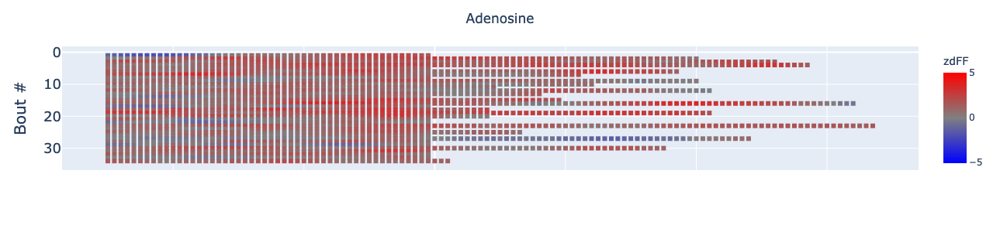

In [419]:
figBR = px.scatter(bout_FP.loc['Region0R'].reset_index(), x='Timestamp', y='lever_bout', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_text='Bout #', title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text=None, showticklabels=False).update_layout(title={'text':"Adenosine", 'x':0.5})
for scatter in figBR.data:
    scatter.marker.symbol = 'square'
figBR.show()

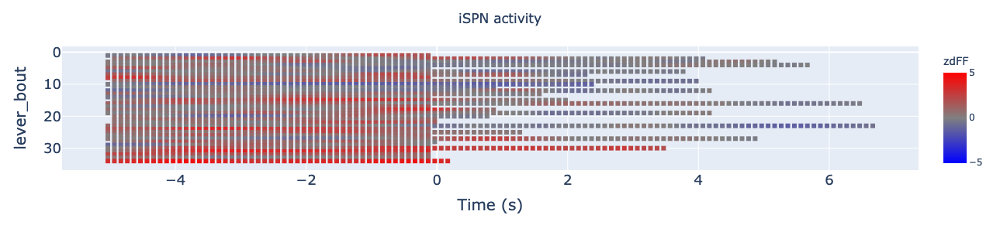

In [420]:
figBG = px.scatter(bout_FP.loc['Region1G'].reset_index(), x='Timestamp', y='lever_bout', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text='Time (s)', title_font={'size': 20}, tickfont={'size': 18}).update_layout(title={'text':"iSPN activity", 'x':0.5})
for scatter in figBG.data:
    scatter.marker.symbol = 'square'
figBG.show()

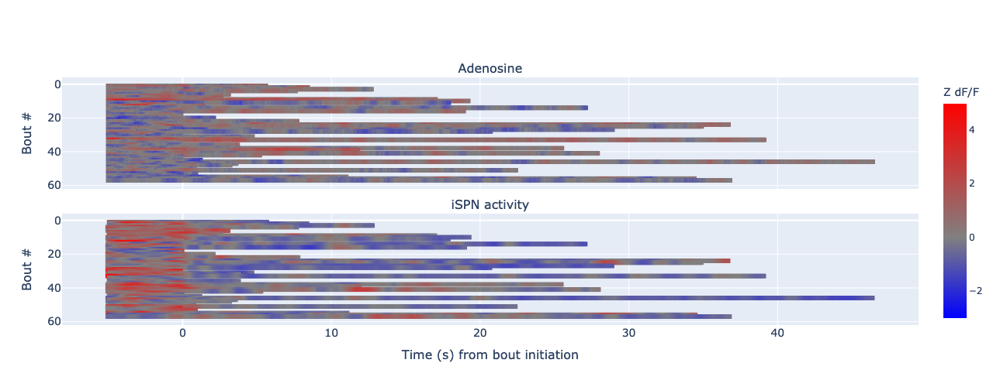

In [363]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Adenosine", "iSPN activity"), vertical_spacing = 0.1, shared_xaxes=True, shared_yaxes=True)
for trace in figBR.data:
    fig.add_trace(trace, row=1, col=1)
for trace in figBG.data:
    fig.add_trace(trace, row=2, col=1)
common_colorscale = [[0, 'blue'], [0.375, 'grey'], [1, 'red']]
coloraxis_range=[-3,5]
fig.update_layout(coloraxis=dict(colorscale=common_colorscale, colorbar_title='Z dF/F', cmin=coloraxis_range[0], cmax=coloraxis_range[1]), height=500)
fig.update_yaxes(autorange='reversed', row=1, col=1, title_text='Bout #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(showticklabels=False, row=1, col=1)
fig.update_yaxes(autorange='reversed', row=2, col=1, title_text='Bout #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(title="Time (s) from bout initiation", showticklabels=True, title_font={'size': 16}, tickfont={'size': 14}, row=2, col=1)
fig.show()

In [34]:
from fibermagic.core.bouts import peribouts

In [35]:
periB = peribouts(dfsx, slogs, window=20, frequency=10)
periB

ValueError: No objects to concatenate

## Plot Perievents

With the synchronization done, we can finally extract a few seconds before and after each event and investigate if there is a common pattern. This is called calculating perievents.

In [442]:
from fibermagic.core.perievents import perievents

peri = perievents(dfsx, slogs[slogs.Event=='FD'], window=10, frequency=10)
peri

/opt/anaconda3/envs/CORE-FP/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/opt/anaconda3/envs/CORE-FP/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/envs/CORE-FP/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by 

Signal  \
Region   Channel Event Timestamp animal.ID lever_bout Trial             
Region0R 560     FD    -10.0     B1206     1          0      0.081616   
                       -9.9      B1206     1          0      0.080255   
                       -9.8      B1206     1          0      0.080107   
                       -9.7      B1206     1          0      0.080225   
                       -9.6      B1206     1          0      0.080240   
...                                                               ...   
Region1G 470     FD     9.6      B1206     52         7      0.021984   
                        9.7      B1206     52         7      0.021895   
                        9.8      B1206     52         7      0.021891   
                        9.9      B1206     52         7      0.021843   
                        10.0     B1206     52         7      0.021917   

                                                             Reference  \
Region   Channel Event Timestamp animal.ID lever_bout Trial              
Region0R 560     FD    -10.0     B1206     1          0       0.014522   
                       -9.9      B1206     1          0       0.014512   
                       -9.8      B1206     1          0       0.014426   
                       -9.7      B1206     1          0       0.014470   
                       -9.6      B1206     1          0       0.014456   
...                                                                ...   
Region1G 470     FD     9.6      B1206     52         7       0.026084   
                        9.7      B1206     52         7       0.026062   
                        9.8      B1206     52         7       0.025987   
                        9.9      B1206     52         7       0.025976   
                        10.0     B1206     52         7       0.025954   

                                                                 zdFF  
Region   Channel Event Timestamp animal.ID lever_bout Trial            
Region0R 560     FD    -10.0     B1206     1          0      0.336155  
                       -9.9      B1206     1          0      0.132094  
                       -9.8      B1206     1          0      0.185628  
                       -9.7      B1206     1          0     -0.196184  
                       -9.6      B1206     1          0      0.266220  
...                                                               ...  
Region1G 470     FD     9.6      B1206     52         7      0.768024  
                        9.7      B1206     52         7      0.730608  
                        9.8      B1206     52         7      0.718835  
                        9.9      B1206     52         7      0.768955  
                        10.0     B1206     52         7      0.768726  

[3216 rows x 3 columns]

In [443]:
from pathlib import Path
output_path = Path('Perievents rAdo1.3+GCaMP8m/airPLS/PR11')
peri.to_csv('B1206rewPR11-30s.csv')

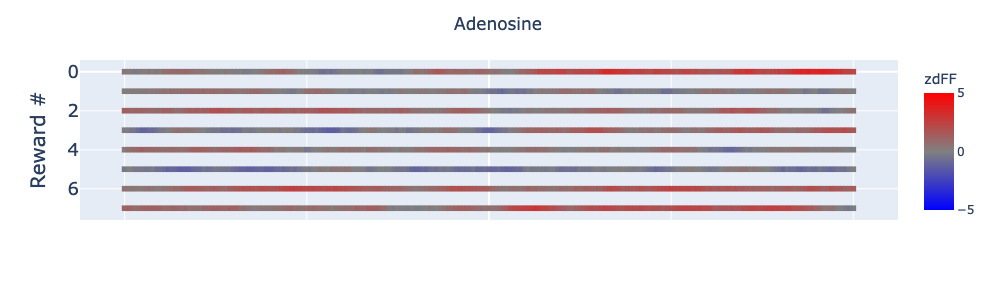

In [444]:
figR = px.scatter(peri.loc['Region0R'].reset_index(), x='Timestamp', y='Trial', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_text='Reward #', title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text=None, showticklabels=False).update_layout(title={'text':"Adenosine", 'x':0.5})
for scatter in figR.data:
    scatter.marker.symbol = 'square'
figR.show()

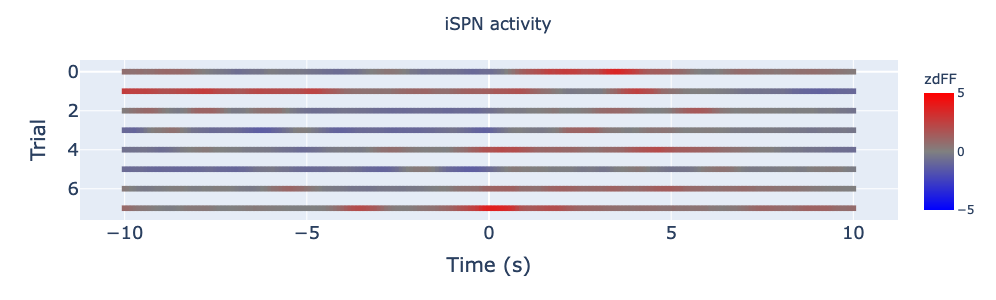

In [445]:
figG = px.scatter(peri.loc['Region1G'].reset_index(), x='Timestamp', y='Trial', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text='Time (s)', title_font={'size': 20}, tickfont={'size': 18}).update_layout(title={'text':"iSPN activity", 'x':0.5})
for scatter in figG.data:
    scatter.marker.symbol = 'square'
figG.show()

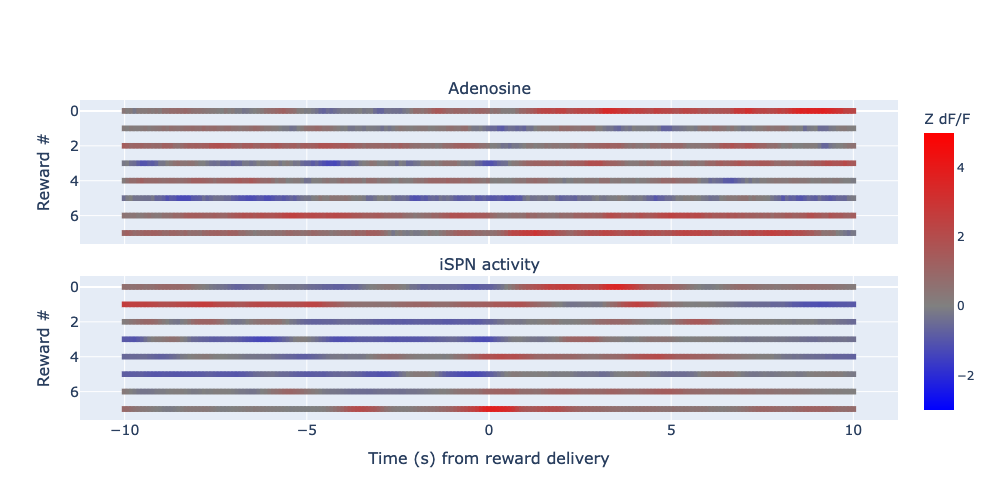

In [446]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Adenosine", "iSPN activity"), vertical_spacing = 0.1, shared_xaxes=True, shared_yaxes=True)
for trace in figR.data:
    fig.add_trace(trace, row=1, col=1)
for trace in figG.data:
    fig.add_trace(trace, row=2, col=1)
common_colorscale = [[0, 'blue'], [0.375, 'grey'], [1, 'red']]
coloraxis_range=[-3,5]
fig.update_layout(coloraxis=dict(colorscale=common_colorscale, colorbar_title='Z dF/F', cmin=coloraxis_range[0], cmax=coloraxis_range[1]), height=500)
fig.update_yaxes(autorange='reversed', row=1, col=1, title_text='Reward #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(showticklabels=False, row=1, col=1)
fig.update_yaxes(autorange='reversed', row=2, col=1, title_text='Reward #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(title="Time (s) from reward delivery", showticklabels=True, title_font={'size': 16}, tickfont={'size': 14}, row=2, col=1)
fig.show()

In [39]:
fig.write_image("Ado+iSPN heatmap.jpg")

# How to analyze big projects

So far, we analyzed one single mouse, one single recording, one single channel. However, in practice, we usually record from 10-20 mice per experiment and have multiple long recordings. This adds up easily to several hundret files together with all the logs produced. It would be very time consuming and error-prone if a researcher would have to analyze every single file on its own.

Fortunately, fibermagic offers functionality to process a full project at once and fully automatically. In addition, fibermagic is very fast and can process full projects within seconds. Ultimately, you can use the same functions, no matter if you load a full project or a single file.

The only thing you have to do is to structure your project into a tree of directories with one category per level. For example, you may want to structure your project into experimental group (condition/control), experimental procedure (e.g. PR2, PR5, PR8, PR11) and recording (e.g. R1, R2, R3). You have to organize your recordings into subdirectories.
```
== condition
      =PR2
          =R1
               data.csv
               input1.csv
               regions_to_mouse.csv
               time.csv
               logs.csv
          =R2
          =R3
      =PR5
      =PR8
      =PR11
 = control
```


In [109]:
#print(os.getcwd())
basepath = (input('Path to your DATA folder:'))
print(f"Basepath for data files is {basepath}\nHopefully the the files and folders are named and organized as expected")



Path to your DATA folder: /Users/rudolffaust/Documents/Adenosine PR Pilot/raw data/


Basepath for data files is /Users/rudolffaust/Documents/Adenosine PR Pilot/raw data/
Hopefully the the files and folders are named and organized as expected


In [325]:
from fibermagic.IO.NeurophotometricsIO import read_project_logs, read_project_rawdata
from pathlib import Path
help(read_project_rawdata)
help(read_project_logs)

Help on function read_project_rawdata in module fibermagic.IO.NeurophotometricsIO:

read_project_rawdata(project_path, subdirs, data_file, ignore_dirs=['meta'])
    Runs standard zdFF processing pipeline on every trial, mouse and sensor and puts data together in a single df
    :param ignore_dirs: array of directories to exclude from reading
    :param subdirs: array with description of subdirectories to be a column
    :param project_path: root path of the project
    :param data_file: name of each file containing raw data
    :return: dataframe with the following multicolumn/index structure
                            Signal      Reference
    Trial 1 mouse A 560     0.1         0.5
                    560     0.25        0.56
                    470     0.13        0.57
            mouse B 560    ...         ...
    Trial 2 mouse A 470    ...
            mouse B 560
    ...     ...

Help on function read_project_logs in module fibermagic.IO.NeurophotometricsIO:

read_project_logs(pr

In [54]:
project_path = Path('Processing')
logs = read_project_logs(project_path,
                                 ['Schedule'], 'logs.csv', ignore_dirs=['meta', 'processed'])
df = read_project_rawdata(project_path,
                          ['Schedule'], 'photometry.csv', ignore_dirs=['meta', 'processed'])
df = add_zdFF(df, smooth_win=10, remove=200).set_index('FrameCounter', append=True)
peri = perievents(df, logs[logs.Event == 'FD'], 5, 25)
output_path = project_path / 'processed'
df.to_csv(output_path / 'datastream.csv')
logs.to_csv(output_path / 'logs.csv')
peri.to_csv(output_path / 'perievents.csv')

NameError: name 'Path' is not defined

In [ ]:
peri = peri.reset_index()
fig = px.scatter(peri[peri.Channel==560], x='Timestamp', y='Trial', color='zdFF (airPLS)', facet_row='Paradigm', facet_col='Mouse',
          range_color=(-5,5), facet_row_spacing=0, facet_col_spacing=0, width=140*len(peri.Mouse.unique()),
                 color_continuous_scale=['blue', 'grey', 'red']).update_yaxes(autorange="reversed")
for scatter in fig.data:
    scatter.marker.symbol = 'square'
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(range = [peri.Timestamp.min(),peri.Timestamp.max()])
fig.update_xaxes(matches='x')
fig.show()

In [ ]:
peri